<h1 ><big><center>MSO 3.4 - Deep Structured Learning</center></big></h1>

<h2><big><center> BE 2 - GANs and cGAN </center></big></h2>

<h5><big><center>Adapted from <i>Projet d'Option</i> of : Mhamed Jabri, Martin Chauvin, Ahmed Sahraoui, Zakariae Moustaïne and Taoufik Bouchikhi


<p align="center">
<img height=300px src="https://cdn-images-1.medium.com/max/1080/0*tJRy5Chmk4XymxwN.png"/></p>
<p align="center"></p>

The aim of this assignment is to discover GANs, understand how they are implemented and then explore one specific architecture of GANs that allows us to perform image to image translation (which corresponds to the picture that you can see above this text ! )

Before starting the exploration of the world of GANs, here's  what students should do and send back for this assignement : 
* In the "tutorial" parts of this assignement that focus on explaining new concepts, you'll find <font color='red'>**questions**</font>  that aim to test your understanding of those concepts. 
* In some of the code cells, you'll have to complete the code and you'll find a "TO DO" explaining what you should implement.

# Part1: DC-GAN

In this part, we aim to learn and understand the basic concepts of **Generative Adversarial Networks** through a DCGAN and generate new celebrities from the learned network after showing it real celebrities. For this purpose, please study the tutorial here: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html


##Work to do
Now we want to generate handwritten digits using the MNIST dataset. It is available within torvision package (https://pytorch.org/vision/stable/generated/torchvision.datasets.MNIST.html#torchvision.datasets.MNIST)

Please re-train the DCGAN and display some automatically generated handwritten digits.



In [81]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

device='cuda:0'
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


> Load MNIST dataset

In [82]:
# Root directory for dataset
# dataroot = "/home/hacklexander/be_gan/celeba/CelebA-20240311T155402Z-001/CelebA/Img"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
# device = "cpu"

In [2]:
imagenet_data = dset.MNIST('./be_gan', transform=transforms.Compose([transforms.ToTensor(), transforms.Resize(size=(64,64)), transforms.Lambda(lambda x: x.repeat(3, 1, 1))]), download=True)

/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

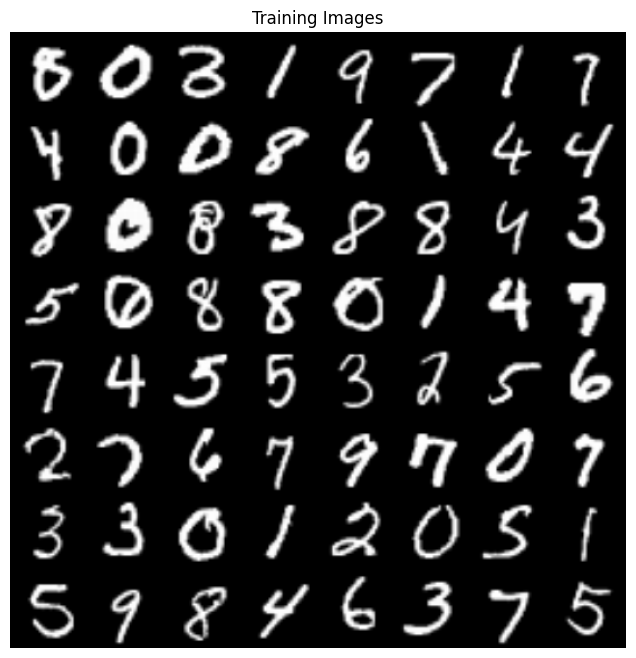

In [18]:
dataloader = torch.utils.data.DataLoader(imagenet_data, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [15]:
real_batch[0].shape

torch.Size([128, 3, 64, 64])

In [16]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)
    
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [17]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [18]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        

Starting Training Loop...


/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

[0/5][0/469]	Loss_D: 1.3771	Loss_G: 4.3004	D(x): 0.5419	D(G(z)): 0.4134 / 0.0203
[0/5][50/469]	Loss_D: 0.2650	Loss_G: 11.5257	D(x): 0.8384	D(G(z)): 0.0002 / 0.0000
[0/5][100/469]	Loss_D: 0.3154	Loss_G: 6.0392	D(x): 0.7853	D(G(z)): 0.0016 / 0.0038
[0/5][150/469]	Loss_D: 0.3813	Loss_G: 7.1882	D(x): 0.9464	D(G(z)): 0.2512 / 0.0016
[0/5][200/469]	Loss_D: 1.4223	Loss_G: 5.1177	D(x): 0.9944	D(G(z)): 0.6085 / 0.0225
[0/5][250/469]	Loss_D: 0.4142	Loss_G: 0.7945	D(x): 0.7062	D(G(z)): 0.0110 / 0.5021
[0/5][300/469]	Loss_D: 0.1244	Loss_G: 3.9433	D(x): 0.9595	D(G(z)): 0.0710 / 0.0276
[0/5][350/469]	Loss_D: 0.1773	Loss_G: 2.4426	D(x): 0.8873	D(G(z)): 0.0405 / 0.1135
[0/5][400/469]	Loss_D: 0.1298	Loss_G: 3.5521	D(x): 0.9493	D(G(z)): 0.0718 / 0.0383
[0/5][450/469]	Loss_D: 0.2498	Loss_G: 2.7697	D(x): 0.8949	D(G(z)): 0.1177 / 0.0782


/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

[1/5][0/469]	Loss_D: 0.2307	Loss_G: 2.8750	D(x): 0.9220	D(G(z)): 0.1267 / 0.0767
[1/5][50/469]	Loss_D: 0.1851	Loss_G: 3.4274	D(x): 0.9611	D(G(z)): 0.1291 / 0.0430
[1/5][100/469]	Loss_D: 0.6410	Loss_G: 3.9050	D(x): 0.9782	D(G(z)): 0.4061 / 0.0339
[1/5][150/469]	Loss_D: 3.6583	Loss_G: 8.0579	D(x): 0.9998	D(G(z)): 0.9560 / 0.0031
[1/5][200/469]	Loss_D: 0.1963	Loss_G: 4.5952	D(x): 0.9626	D(G(z)): 0.1352 / 0.0151
[1/5][250/469]	Loss_D: 2.4093	Loss_G: 0.4673	D(x): 0.2250	D(G(z)): 0.0417 / 0.7036
[1/5][300/469]	Loss_D: 0.1792	Loss_G: 3.0023	D(x): 0.9066	D(G(z)): 0.0699 / 0.0664
[1/5][350/469]	Loss_D: 0.4559	Loss_G: 2.3316	D(x): 0.8171	D(G(z)): 0.1929 / 0.1150
[1/5][400/469]	Loss_D: 0.2302	Loss_G: 2.6525	D(x): 0.8455	D(G(z)): 0.0467 / 0.0962
[1/5][450/469]	Loss_D: 1.4732	Loss_G: 1.7215	D(x): 0.6643	D(G(z)): 0.5978 / 0.2170


/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

[2/5][0/469]	Loss_D: 0.9553	Loss_G: 1.1353	D(x): 0.5013	D(G(z)): 0.1379 / 0.3645
[2/5][50/469]	Loss_D: 0.2372	Loss_G: 1.9391	D(x): 0.8391	D(G(z)): 0.0450 / 0.1768
[2/5][100/469]	Loss_D: 0.4341	Loss_G: 1.8537	D(x): 0.7997	D(G(z)): 0.1640 / 0.1967
[2/5][150/469]	Loss_D: 0.3796	Loss_G: 2.2133	D(x): 0.7876	D(G(z)): 0.1078 / 0.1363
[2/5][200/469]	Loss_D: 0.1806	Loss_G: 3.9059	D(x): 0.9515	D(G(z)): 0.1165 / 0.0273
[2/5][250/469]	Loss_D: 0.2673	Loss_G: 3.0975	D(x): 0.9194	D(G(z)): 0.1544 / 0.0626
[2/5][300/469]	Loss_D: 0.7579	Loss_G: 1.3521	D(x): 0.6385	D(G(z)): 0.2112 / 0.3013
[2/5][350/469]	Loss_D: 1.5193	Loss_G: 1.2948	D(x): 0.2813	D(G(z)): 0.0133 / 0.3461
[2/5][400/469]	Loss_D: 0.6576	Loss_G: 2.2780	D(x): 0.7964	D(G(z)): 0.3063 / 0.1390
[2/5][450/469]	Loss_D: 3.3586	Loss_G: 0.0146	D(x): 0.0784	D(G(z)): 0.0026 / 0.9858


/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

[3/5][0/469]	Loss_D: 0.6300	Loss_G: 1.8086	D(x): 0.7324	D(G(z)): 0.2336 / 0.1948
[3/5][50/469]	Loss_D: 0.3711	Loss_G: 2.6680	D(x): 0.8858	D(G(z)): 0.2039 / 0.0908
[3/5][100/469]	Loss_D: 0.1337	Loss_G: 4.3838	D(x): 0.9650	D(G(z)): 0.0890 / 0.0175
[3/5][150/469]	Loss_D: 0.1921	Loss_G: 2.9686	D(x): 0.8586	D(G(z)): 0.0252 / 0.0660
[3/5][200/469]	Loss_D: 2.2896	Loss_G: 0.2967	D(x): 0.1690	D(G(z)): 0.0665 / 0.7632
[3/5][250/469]	Loss_D: 0.4961	Loss_G: 2.7477	D(x): 0.8554	D(G(z)): 0.2552 / 0.0814
[3/5][300/469]	Loss_D: 0.2938	Loss_G: 3.0103	D(x): 0.8879	D(G(z)): 0.1472 / 0.0653
[3/5][350/469]	Loss_D: 0.4163	Loss_G: 2.4015	D(x): 0.7858	D(G(z)): 0.1383 / 0.1191
[3/5][400/469]	Loss_D: 1.1940	Loss_G: 1.0344	D(x): 0.4547	D(G(z)): 0.2591 / 0.3930
[3/5][450/469]	Loss_D: 0.2254	Loss_G: 3.9050	D(x): 0.9532	D(G(z)): 0.1494 / 0.0298


/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

[4/5][0/469]	Loss_D: 0.1509	Loss_G: 4.7288	D(x): 0.9676	D(G(z)): 0.1044 / 0.0136
[4/5][50/469]	Loss_D: 0.6696	Loss_G: 1.3556	D(x): 0.6158	D(G(z)): 0.0913 / 0.3207
[4/5][100/469]	Loss_D: 0.2318	Loss_G: 5.0990	D(x): 0.9840	D(G(z)): 0.1715 / 0.0097
[4/5][150/469]	Loss_D: 0.3186	Loss_G: 3.2184	D(x): 0.9244	D(G(z)): 0.1895 / 0.0578
[4/5][200/469]	Loss_D: 0.0593	Loss_G: 4.6370	D(x): 0.9635	D(G(z)): 0.0205 / 0.0161
[4/5][250/469]	Loss_D: 0.6855	Loss_G: 2.2223	D(x): 0.8798	D(G(z)): 0.3782 / 0.1480
[4/5][300/469]	Loss_D: 0.0748	Loss_G: 3.7678	D(x): 0.9633	D(G(z)): 0.0354 / 0.0322
[4/5][350/469]	Loss_D: 0.0677	Loss_G: 4.4924	D(x): 0.9516	D(G(z)): 0.0161 / 0.0184
[4/5][400/469]	Loss_D: 0.0539	Loss_G: 4.8799	D(x): 0.9583	D(G(z)): 0.0103 / 0.0135
[4/5][450/469]	Loss_D: 0.8074	Loss_G: 5.1097	D(x): 0.9650	D(G(z)): 0.4776 / 0.0088


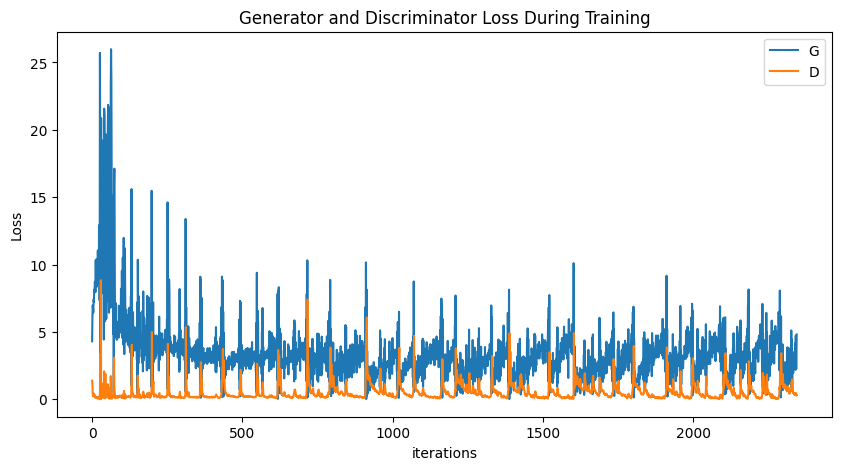

In [19]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

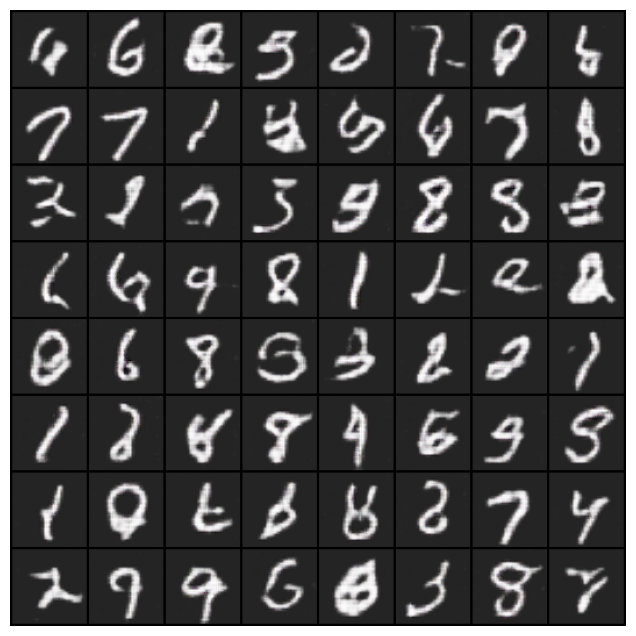

In [20]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/home/hacklexander/.local/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in or

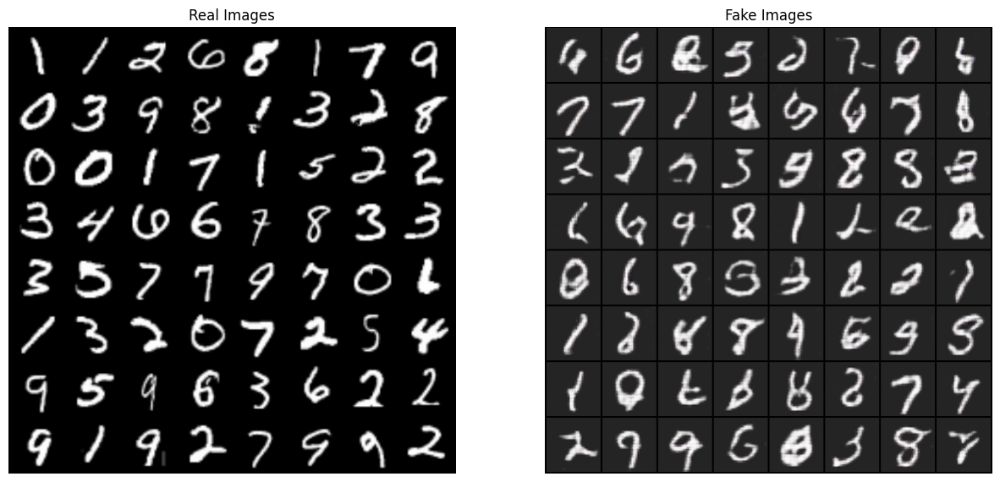

In [21]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Part2: Conditional GAN (cGAN)

Let's take the example of the set described in the next picture.
![Map to satellite picture](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/map_streetview.png)

We have a picture of a map (from Google Maps) and we want to create an image of what the satellite view may look like.

As we are not only trying to generate a random picture but a mapping between a picture to another one, we can't use the standard GAN architecture. We will then use a cGAN introduced in this [paper](https://arxiv.org/pdf/1611.07004.pdf).

A cGAN is a supervised GAN aiming at mapping a label picture to a real one or a real picture to a label one. As you can see in the diagram below, the discriminator will take as input a pair of images and try to predict if the pair was generated or not. The generator will not only generate an image from noise but will also use an image (label or real) to generate another one (real or label).
![Diagram of how a cGan works](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/cgan_map.png)


### Generator

In the cGAN architecture, the generator chosen is a U-Net.
![U-Net](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/unet.png)

A U-Net takes as input an image, and outputs another image. 

It can be divided into 2 subparts : an encoder and a decoder. 
* The encoder takes the input image and reduces its dimension to encode the main features into a vector. 
* The decoder takes this vector and map the features stored into an image.

A U-Net architecture is different from a classic encoder-decoder in that every layer of the decoder takes as input the previous decoded output as well as the output vector from the encoder layers of the same level. It allows the decoder to map low frequencies information encoded during the descent as well as high frequencies from the original picture. 

![U-Net](https://www.researchgate.net/profile/Baris_Turkbey/publication/315514772/figure/fig2/AS:485824962797569@1492841105670/U-net-architecture-Each-box-corresponds-to-a-multi-channel-features-maps-The-number-of.png)

The architecture we will implement is the following (the number in the square is the number of filters used).
![UNet Architecture](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/unet_architecture.png)

The encoder will take as input a colored picture (3 channels: RGB), it will pass through a series of convolution layers to encode the features of the picture. It will then be decoded by the decoder using transposed convolutional layers. These layers will take as input the previous decoded vector AND the encoded features of the same level. 

Now, let's create or cGAN to generate facades from a template image. For this purpose, we will use the "Facade" dataset available at http://cmp.felk.cvut.cz/~tylecr1/facade/.


Let's first create a few classes describing the layers we will use in the U-Net.

In [1]:
# Importing all the libraries needed
import matplotlib.pyplot as plt
import imageio
import glob
import random
import os
import numpy as np
import math
import itertools
import time
import datetime
import cv2
from pathlib import Path
from PIL import Image

from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.utils import save_image, make_grid
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

In [2]:
# code adapted from https://github.com/milesial/Pytorch-UNet/blob/master/unet/unet_parts.py

# Input layer
class inconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(inconv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Encoder layer
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Decoder layer
class up(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=False):
        super(up, self).__init__()
        if dropout :
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.Dropout(0.5, inplace=True),
                nn.ReLU(inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

    def forward(self, x1, x2):
        x1 = self.conv(x1)
        x = torch.cat([x1, x2], dim=1)
        return x

# Output layer
class outconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(outconv, self).__init__()
        self.conv = nn.Sequential(
              nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
              nn.Tanh()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the U-Net using the helper classes defined previously.

In [3]:
class U_Net(nn.Module):
    ''' 
    Ck denotes a Convolution-BatchNorm-ReLU layer with k filters.
    CDk denotes a Convolution-BatchNorm-Dropout-ReLU layer with a dropout rate of 50%
    Encoder:
      C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
    Decoder:
      CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
    '''
    def __init__(self, n_channels, n_classes):
        super(U_Net, self).__init__()
        ngf = 64
        # Encoder
        # ngf=64, defined above
        self.inc = inconv(n_channels, ngf) # 64 filters
        # TO DO :
        # Create the 7 encoder layers called "down1" to "down7" following this sequence
        # C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
        # The first one has already been implemented

        self.down1 = down(ngf, 2*ngf)
        self.down2 = down(2*ngf, 4*ngf)
        self.down3 = down(4*ngf, 8*ngf)
        self.down4 = down(8*ngf, 8*ngf)
        self.down5 = down(8*ngf, 8*ngf)
        self.down6 = down(8*ngf, 8*ngf)
        self.down7 = down(8*ngf, 8*ngf)


        # Decoder
        # TO DO :
        # Create the 7 decoder layers called up1 to up7 following this sequence :
        # CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
        # The last layer has already been defined
        self.up7 = up(8*ngf, 8*ngf)
        self.up6 = up(8*2*ngf, 8*ngf)
        self.up5 = up(8*2*ngf, 8*ngf)
        self.up4 = up(8*2*ngf, 8*ngf)
        self.up3 = up(8*2*ngf, 4*ngf)
        self.up2 = up(4*2*ngf, 2*ngf)
        self.up1 = up(2*2*ngf, ngf)

        
        self.outc = outconv(128, n_classes) # 128 filters

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x6 = self.down5(x5)
        x7 = self.down6(x6)
        x8 = self.down7(x7)
        # At this stage x8 is our encoded vector, we will now decode it
        x = self.up7(x8, x7)
        x = self.up6(x, x6)
        x = self.up5(x, x5)
        x = self.up4(x, x4)
        x = self.up3(x, x3)
        x = self.up2(x, x2)
        x = self.up1(x, x1)
        x = self.outc(x)
        return x

In [4]:
# We take images that have 3 channels (RGB) as input and output an image that also have 3 channels (RGB)
generator=U_Net(3,3)
device = 'cuda:0'
# Check that the architecture is as expected
generator
generator.to(device)

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

You should now have a working U-Net.

<font color='red'>**Question 1**</font>                                                                  
Knowing the input and output images will be 256x256, what will be the dimension of the encoded vector x8  ?

> All Conv2D layers use the same isotropic stride/padding, so we can use the equation from the [Pytorch website](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html): <br>
$\begin{equation} H_{out}​=\frac{H_{in}+2×padding-dilation×(kernel\_size−1)-1}{stride}+1\end{equation}$

> With
>> stride = 2 <br>
>> padding = 1 <br>
>> kernel_size = 4 <br>
>> dilation = 1 (default), <br>

> It yields: $H_{out} = \frac{H_{in}}{2}$ <br>
> So, after 8 convolutional layers, the input dimension is divided by $2^8=256$ <br>
> The dimension of the encoded latent vector is therefore __512x1x1__.

<font color='red'>**Question 2**</font>                                                                  
As you can see, U-net has an encoder-decoder architecture with skip connections. Explain why it works better than a traditional encoder-decoder.
> The latent vector doesn't have any spatial information, because the image has been shrunk. <br>
> The skip connections gradually add spatial information to the decoded feature map, which are therefore closer to the encoder feature maps, while having the encoded information. <br>
> These spatial information are called 'high frequency information' in the introduction : this is the type of information that gets lost rapidly by convolutions, which do a weighted average of neighboring pixels. <br>
> In another BE, we trained a UNeT without skip connections. The final training/validation losses were around 5% higher than with skip connections.

### Discriminator

In the cGAN architecture, the chosen discriminator is a Patch GAN. It is a convolutional discriminator which enables to produce a map of the input pictures where each pixel represents a patch of size NxN of the input.

![patch GAN](https://raw.githubusercontent.com/Neyri/Projet-cGAN/master/BE/img/patchGAN.png)

The size N is given by the depth of the net. According to this table :

| Number of layers | N |
| ---- | ---- |
| 1 | 16 |
| 2 | 34 |
| 3 | 70 |
| 4 | 142 |
| 5 | 286 |
| 6 | 574 |

The number of layers actually means the number of layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(2,2)`. These layers are followed by 2 layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(1,1)`.
In our case we are going to create a 70x70 PatchGAN.

Let's first create a few helping classes.

In [5]:
class conv_block(nn.Module):
    def __init__(self, in_ch, out_ch, use_batchnorm=True, stride=2):
        super(conv_block, self).__init__()
        if use_batchnorm:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.BatchNorm2d(out_ch),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )

    def forward(self, x):
        x = self.conv(x)
        return x
    

class out_block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(out_block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, 1, kernel_size=4, padding=1, stride=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the Patch GAN discriminator.
As we want a 70x70 Patch GAN, the architecture will be as follows :
```
1. C64  - K4, P1, S2
2. C128 - K4, P1, S2
3. C256 - K4, P1, S2
4. C512 - K4, P1, S1
5. C1   - K4, P1, S1 (output)
```
Where Ck denotes a convolution block with k filters, Kk a kernel of size k, Pk is the padding size and Sk the stride applied.
*Note :* For the first layer, we do not use batchnorm.

<font color='red'>**Question 3**</font>                                                                  
Knowing input images will be 256x256 with 3 channels each, how many parameters are there to learn ? <br>
> Each conv layer can have:
- a Conv2d layer, which has out_ch kernels, each with 4x4 parameters, so out_ch*16 parameters <br>
- a BatchNorm2d layer, which has two vectors $\gamma$ and $\beta$, each of size out_ch, so out_ch*2 parameters <br>

> Hence, each conv layer with batchnorm has $out\_ch*18$ parameters, and $out\_ch*16$ if it doesn't have a batchnorm layer. <br>
> Therefore, only the first and last layers have $out\_ch*16$ parameters, the other ones have $out\_ch*18$. <br>

> So:
$\begin{equation} N_{parameters} = (64+1)*16 + (128+256+512)*18= 65*16 + 896*18 = 17168 \end{equation}$

In [6]:
class PatchGAN(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(PatchGAN, self).__init__()
        # TODO :
        # create the 4 first layers named conv1 to conv4
        self.conv1 = conv_block(n_channels, 64, False, stride=2)
        self.conv2 = conv_block(64, 128, True, stride=2)
        self.conv3 = conv_block(128, 256, True, stride=2)
        self.conv4 = conv_block(256, 512, True, stride=1)
        # output layer
        self.out = out_block(512, n_classes)
        
    def forward(self, x1, x2):
        x = torch.cat([x2, x1], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.out(x)
        return x

In [7]:
# We have 6 input channels as we concatenate 2 images (with 3 channels each)
discriminator = PatchGAN(6,1)
discriminator
discriminator.to(device)

PatchGAN(
  (conv1): conv_block(
    (conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv2): conv_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv3): conv_block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv4): conv_block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReL

You should now have a working discriminator.

### Loss functions

As we have seen in the choice of the various architectures for this GAN, the issue is to map both low and high frequencies.
To tackle this problem, this GAN rely on the architecture to map the high frequencies (U-Net + PatchGAN) and the loss function to learn low frequencies features. The global loss function will indeed be made of 2 parts :
* the first part to map hight frequencies, will try to optimize the mean squared error BCE Loss of the GAN.
* the second part to map low frequencies, will minimize the $\mathcal{L}_1$ norm of the generated picture.

So the loss can be defined as $$ G^* = arg\ \underset{G}{min}\ \underset{D}{max}\ \mathcal{L}_{cGAN}(G,D) + \lambda \mathcal{L}_1(G)$$

> It would be better to use the BCE loss instead of the MSE loss to 'map' high frequencies. <br> 
Quoting from the article: <br>
``` 
It is well known that the L2 loss – and L1, see Figure 4 – produces blurry results on image generation problems [34]. Although these losses fail to encourage high-frequency crispness, in many cases they nonetheless accurately capture the low frequencies. 
```
> I tried to use the BCE loss, however the cGAN crashed after 1 epoch (NaN outputs of the discriminator). Maybe the parameters proposed are to blame, I didn't try to fine tune them.

In [8]:
# Loss functions
criterion_GAN = torch.nn.MSELoss()
# criterion_GAN = torch.nn.BCELoss()

criterion_pixelwise = torch.nn.L1Loss()

# Loss weight of L1 pixel-wise loss between translated image and real image
lambda_pixel = 100

### Training and evaluating models 

In [9]:
# parameters
epoch = 0 #  epoch to start training from
n_epoch = 200  #  number of epochs of training
batch_size =10  #  size of the batches
lr = 0.0002 #  adam: learning rate
b1 =0.5  #  adam: decay of first order momentum of gradient
b2 = 0.999  # adam: decay of first order momentum of gradient
decay_epoch = 100  # epoch from which to start lr decay
img_height = 256  # size of image height
img_width = 256  # size of image width
channels = 3  # number of image channels
sample_interval = 500 # interval between sampling of images from generators
checkpoint_interval = -1 # interval between model checkpoints
# cuda = True if torch.cuda.is_available() else False # do you have cuda ?
cuda = True

Download the dataset. 


In [18]:
import urllib.request
from tqdm import tqdm
import os
import zipfile

def download_hook(t):
    """Wraps tqdm instance.
    Don't forget to close() or __exit__()
    the tqdm instance once you're done with it (easiest using `with` syntax).
    Example
    -------
    >>> with tqdm(...) as t:
    ...     reporthook = my_hook(t)
    ...     urllib.request.urlretrieve(..., reporthook=reporthook)
    """
    last_b = [0]

    def update_to(b=1, bsize=1, tsize=None):
        """
        b  : int, optional
            Number of blocks transferred so far [default: 1].
        bsize  : int, optional
            Size of each block (in tqdm units) [default: 1].
        tsize  : int, optional
            Total size (in tqdm units). If [default: None] remains unchanged.
        """
        if tsize is not None:
            t.total = tsize
        t.update((b - last_b[0]) * bsize)
        last_b[0] = b

    return update_to

def download(url, save_dir):
    filename = url.split('/')[-1]
    with tqdm(unit = 'B', unit_scale = True, unit_divisor = 1024, miniters = 1, desc = filename) as t:
        urllib.request.urlretrieve(url, filename = os.path.join(save_dir, filename), reporthook = download_hook(t), data = None)

if __name__ == '__main__':
    # Download ground truth
    if not os.path.exists("CMP_facade_DB_base.zip"):
        download("http://cmp.felk.cvut.cz/~tylecr1/facade/CMP_facade_DB_base.zip", "./")
    # Extract in the correct folder
    with zipfile.ZipFile("CMP_facade_DB_base.zip", 'r') as zip_ref:
        zip_ref.extractall("./facades")
        os.rename("./facades/base", "./facades/train")

    # Download ground truth
    if not os.path.exists("CMP_facade_DB_extended.zip"):
        download("http://cmp.felk.cvut.cz/~tylecr1/facade/CMP_facade_DB_extended.zip", "./")
    # Extract in the correct folder
    with zipfile.ZipFile("CMP_facade_DB_extended.zip", 'r') as zip_ref:
        zip_ref.extractall("./facades")
        os.rename("./facades/extended", "./facades/val")


OSError: [Errno 39] Directory not empty: './facades/base' -> './facades/train'

Configure the dataloader

In [10]:
class ImageDataset(Dataset):
    def __init__(self, root, transforms_=None, mode='train'):
        self.transform = transforms.Compose(transforms_)

        self.files_img = sorted(glob.glob(os.path.join(root, mode) + '/*.jpg'))
        if mode == 'val':
            self.files_img.extend(
                sorted(glob.glob(os.path.join(root, 'val') + '/*.jpg')))

        self.files_mask = sorted(glob.glob(os.path.join(root, mode) + '/*.png'))
        if mode == 'val':
            self.files_mask.extend(
                sorted(glob.glob(os.path.join(root, 'val') + '/*.png')))
            
        assert len(self.files_img) == len(self.files_mask)

    def __getitem__(self, index):

        img = Image.open(self.files_img[index % len(self.files_img)])
        mask = Image.open(self.files_mask[index % len(self.files_img)])
        mask = mask.convert('RGB')

        img = self.transform(img)
        mask = self.transform(mask)

        return img, mask

    def __len__(self):
        return len(self.files_img)
    
# Configure dataloaders
transforms_ = [transforms.Resize((img_height, img_width), Image.BICUBIC),
               transforms.ToTensor()]  # transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))

dataloader = DataLoader(ImageDataset("facades", transforms_=transforms_),
                        batch_size=16, shuffle=True)

val_dataloader = DataLoader(ImageDataset("facades", transforms_=transforms_, mode='val'),
                            batch_size=8, shuffle=False)

# Tensor type
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

Check the loading works and a few helper functions

In [11]:
def plot2x2Array(image, mask):
    f, axarr = plt.subplots(1, 2)
    axarr[0].imshow(image)
    axarr[1].imshow(mask)

    axarr[0].set_title('Image')
    axarr[1].set_title('Mask')


def reverse_transform(image):
    image = image.numpy().transpose((1, 2, 0))
    image = np.clip(image, 0, 1)
    image = (image * 255).astype(np.uint8)

    return image

def plot2x3Array(image, mask,predict):
    f, axarr = plt.subplots(1,3,figsize=(15,15))
    axarr[0].imshow(image)
    axarr[1].imshow(mask)
    axarr[2].imshow(predict)
    axarr[0].set_title('input')
    axarr[1].set_title('real')
    axarr[2].set_title('fake')

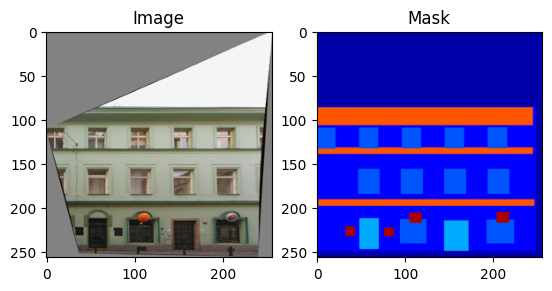

In [12]:
image, mask = next(iter(dataloader))
image = reverse_transform(image[0])
mask = reverse_transform(mask[0])
plot2x2Array(image, mask)

Initialize our GAN

In [13]:
# Calculate output of image discriminator (PatchGAN)
patch = (1, img_height//2**3-2, img_width//2**3-2)

if cuda:
    generator = generator.cuda()
    discriminator = discriminator.cuda()
    criterion_GAN.cuda()
    criterion_pixelwise.cuda()
    
# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

Start training

In [15]:
def save_model(epoch):
    # save your work
    torch.save({
                'epoch': epoch,
                'model_state_dict': generator.state_dict(),
                'optimizer_state_dict': optimizer_G.state_dict(),
                'loss': loss_G,
                }, 'generator_'+str(epoch)+'.pth')
    torch.save({
                'epoch': epoch,
                'model_state_dict': discriminator.state_dict(),
                'optimizer_state_dict': optimizer_D.state_dict(),
                'loss': loss_D,
                }, 'discriminator_'+str(epoch)+'.pth')
    
def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
      torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm2d') != -1:
      torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
      torch.nn.init.constant_(m.bias.data, 0.0)

<font color='red'>Complete the loss function </font>  in the following training code and train your network:  

In [16]:
# ----------
#  Training
# ----------

losses = []
num_epochs = 200

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)
epoch_D = 0
epoch_G = 0

# train the network
discriminator.train()
generator.train()
print_every = 400

for epoch in range(epoch_G, num_epochs):
    for i, batch in enumerate(dataloader):

        # Model inputs
        real_A = Variable(batch[0].type(Tensor)) # image
        real_B = Variable(batch[1].type(Tensor)) # mask

        # Adversarial ground truths
        valid = Variable(Tensor(np.ones((real_B.size(0), *patch))), requires_grad=False)
        fake = Variable(Tensor(np.zeros((real_B.size(0), *patch))), requires_grad=False)

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        fake_B = generator(real_B) # image from mask

        # Real loss
        pred_real = discriminator(real_A, real_B) # log(D(x,y)), log(D(real_mask, real_image))
        loss_real = criterion_GAN(pred_real, valid)

        # Fake loss 
        pred_fake = discriminator(fake_B.detach(), real_B)
        loss_fake = criterion_GAN(pred_fake, fake)

        # Total loss
        loss_D = 0.5 * (loss_real + loss_fake)

        loss_D.backward()
        optimizer_D.step()

        # ------------------
        #  Train Generators
        # ------------------

        optimizer_G.zero_grad()

        # fake_A = generator(real_A) # mask from image 

        # GAN loss
        # TO DO: Put here your GAN loss
        output_d_image = discriminator(real_B, fake_B) # discriminator(real_mask, fake_image)
        gan_loss = criterion_GAN(valid, output_d_image)

        # Pixel-wise loss
        # TO DO: Put here your pixel loss
        pixel_wise_loss = criterion_pixelwise(fake_B, real_A)

        # Total loss
        # TO DO: Put here your total loss
        loss_G = gan_loss + lambda_pixel*pixel_wise_loss

        loss_G.backward()

        optimizer_G.step()

        
        # Print some loss stats
        if i % print_every == 0:
            # print discriminator and generator loss
            print('Epoch [{:5d}/{:5d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                    epoch+1, num_epochs, loss_D.item(), loss_G.item()))
    ## AFTER EACH EPOCH##
    # append discriminator loss and generator loss
    losses.append((loss_D.item(), loss_G.item()))
    if epoch % 100 == 99:
        print('Saving model...')
        save_model(epoch)


/tmp/ipykernel_240292/3287649016.py:27: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at ../torch/csrc/tensor/python_tensor.cpp:83.)
  valid = Variable(Tensor(np.ones((real_B.size(0), *patch))), requires_grad=False)


Epoch [    1/  200] | d_loss: 0.3051 | g_loss: 52.4559
Epoch [    2/  200] | d_loss: 0.1129 | g_loss: 20.8549
Epoch [    3/  200] | d_loss: 0.0538 | g_loss: 16.7652
Epoch [    4/  200] | d_loss: 0.0304 | g_loss: 16.0632
Epoch [    5/  200] | d_loss: 0.0192 | g_loss: 15.3648
Epoch [    6/  200] | d_loss: 0.0214 | g_loss: 14.5401
Epoch [    7/  200] | d_loss: 0.0093 | g_loss: 14.2938
Epoch [    8/  200] | d_loss: 0.3085 | g_loss: 13.7053
Epoch [    9/  200] | d_loss: 0.0062 | g_loss: 13.4394
Epoch [   10/  200] | d_loss: 0.0113 | g_loss: 13.3716
Epoch [   11/  200] | d_loss: 0.0079 | g_loss: 12.7330
Epoch [   12/  200] | d_loss: 0.0104 | g_loss: 11.9016
Epoch [   13/  200] | d_loss: 0.0058 | g_loss: 10.9612
Epoch [   14/  200] | d_loss: 0.0013 | g_loss: 10.2974
Epoch [   15/  200] | d_loss: 0.0007 | g_loss: 10.7075
Epoch [   16/  200] | d_loss: 0.0022 | g_loss: 9.6556
Epoch [   17/  200] | d_loss: 0.0018 | g_loss: 10.4112
Epoch [   18/  200] | d_loss: 0.0015 | g_loss: 9.5690
Epoch [   19

Observation of the loss along the training

In [ ]:
save_model(200)

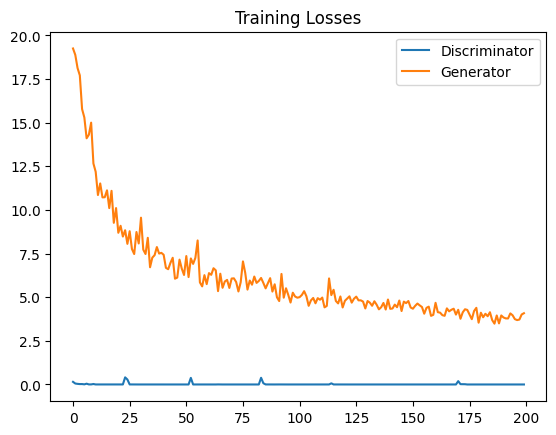

In [17]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()


If the training takes too much time, you can use a pretrained model in the meantime, to evaluate its performance.

It is available at : https://partage.liris.cnrs.fr/index.php/s/xwEFmxn9ANeq4zY

### Evaluate your cGAN

In [19]:
def load_model(epoch=200):
    if 'generator_'+str(epoch)+'.pth' in os.listdir() and 'discriminator_'+str(epoch)+'.pth' in os.listdir():
        if cuda:
            checkpoint_generator = torch.load('generator_'+str(epoch)+'.pth')
        else:
            checkpoint_generator = torch.load('generator_'+str(epoch)+'.pth', map_location='cpu')
        generator.load_state_dict(checkpoint_generator['model_state_dict'])
        optimizer_G.load_state_dict(checkpoint_generator['optimizer_state_dict'])
        epoch_G = checkpoint_generator['epoch']
        loss_G = checkpoint_generator['loss']

        if cuda:
            checkpoint_discriminator = torch.load('discriminator_'+str(epoch)+'.pth')
        else:
            checkpoint_discriminator = torch.load('discriminator_'+str(epoch)+'.pth', map_location='cpu')
        discriminator.load_state_dict(checkpoint_discriminator['model_state_dict'])
        optimizer_D.load_state_dict(checkpoint_discriminator['optimizer_state_dict'])
        epoch_D = checkpoint_discriminator['epoch']
        loss_D = checkpoint_discriminator['loss']
    else:
        print('There isn\' a training available with this number of epochs')

In [22]:
load_model(epoch=199)

# switching mode
generator.eval()

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

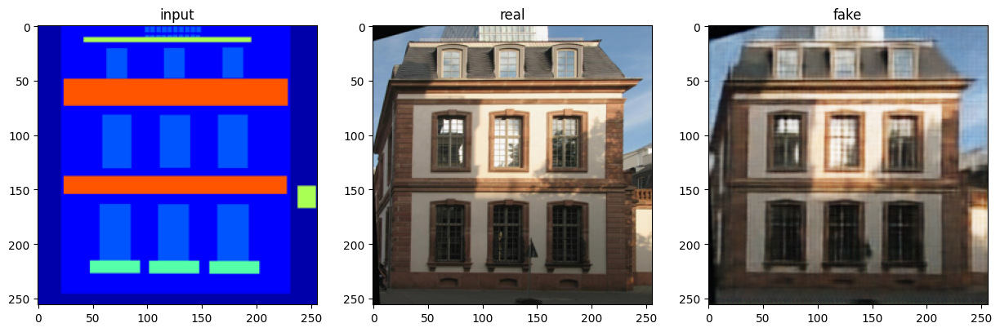

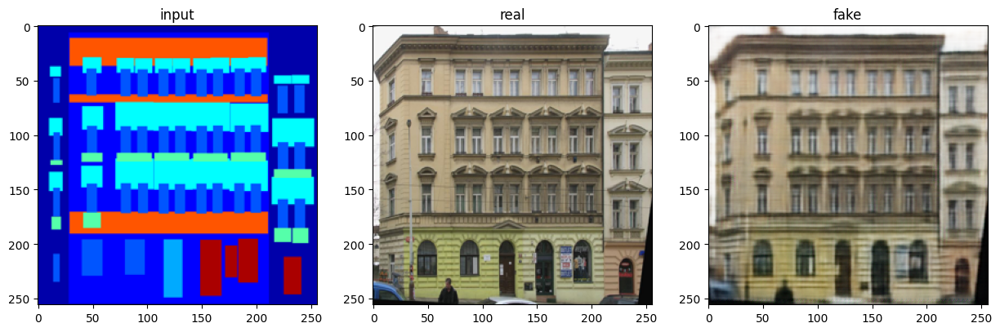

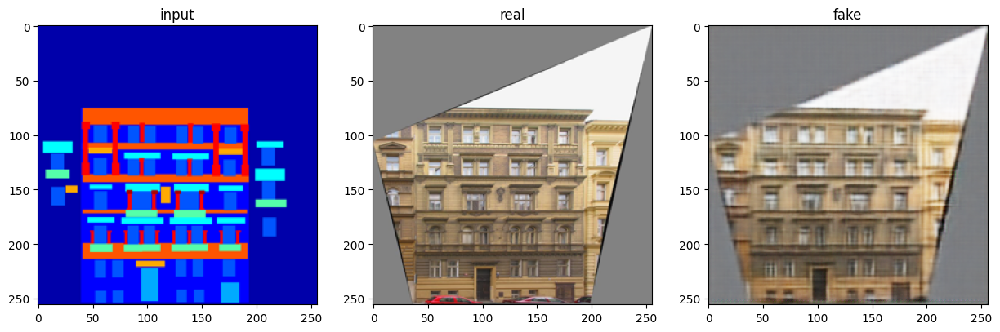

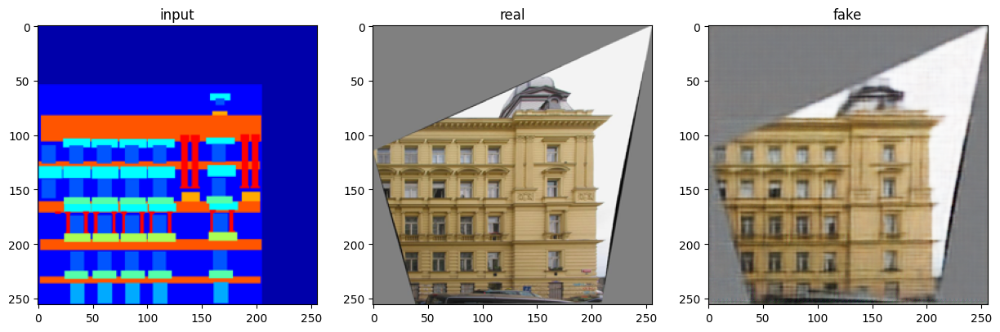

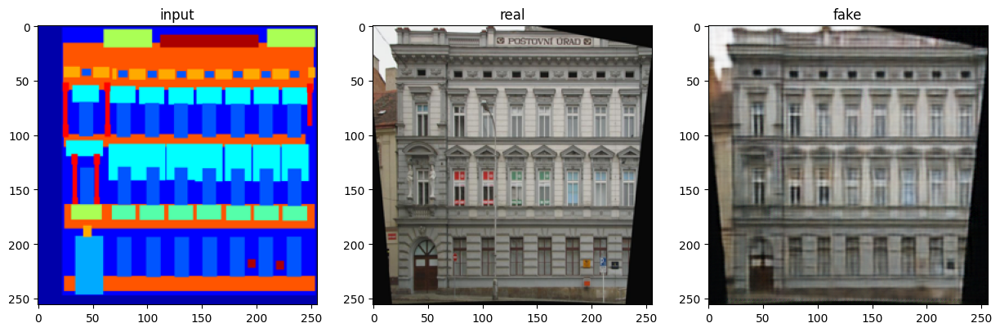

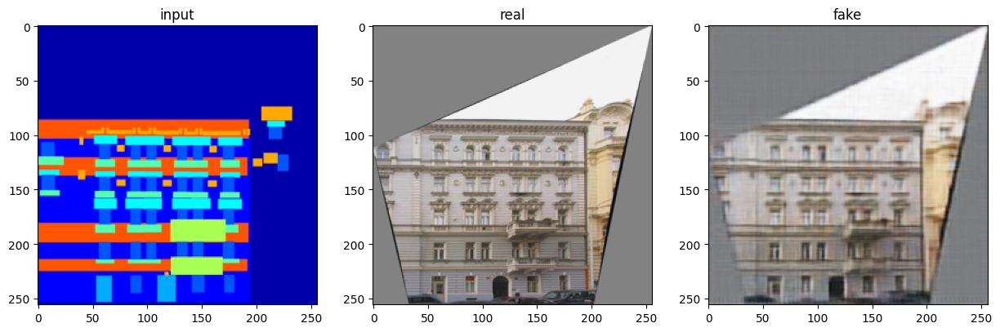

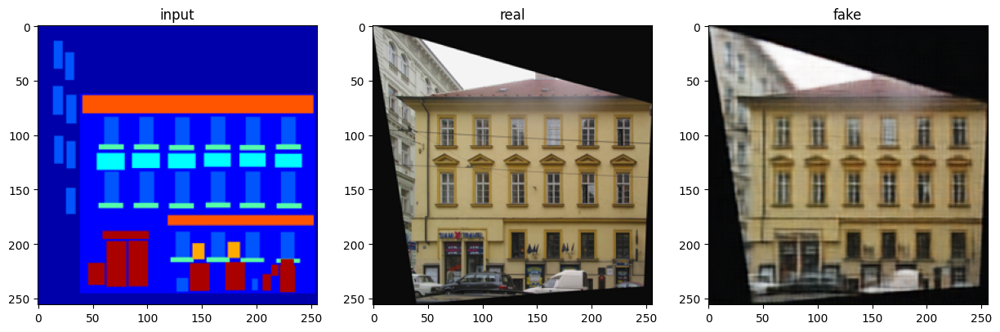

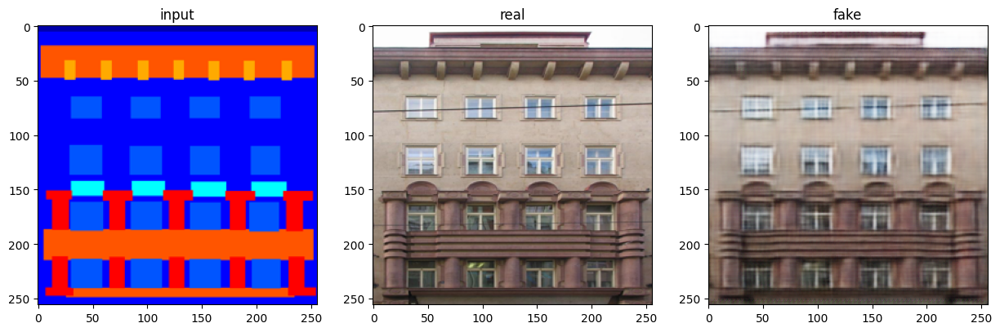

In [23]:
# show a sample evaluation image on the training base
image, mask = next(iter(dataloader))
output = generator(mask.type(Tensor))
output = output.view(16, 3, 256, 256)
output = output.cpu().detach()
for i in range(8):
    image_plot = reverse_transform(image[i])
    output_plot = reverse_transform(output[i])
    mask_plot = reverse_transform(mask[i])
    plot2x3Array(mask_plot,image_plot,output_plot)

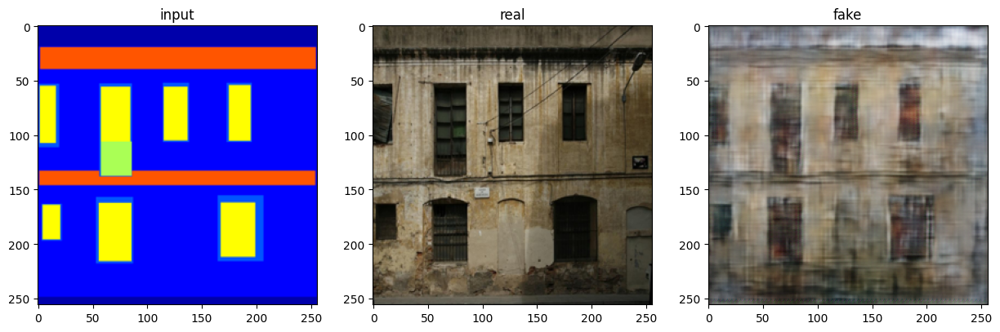

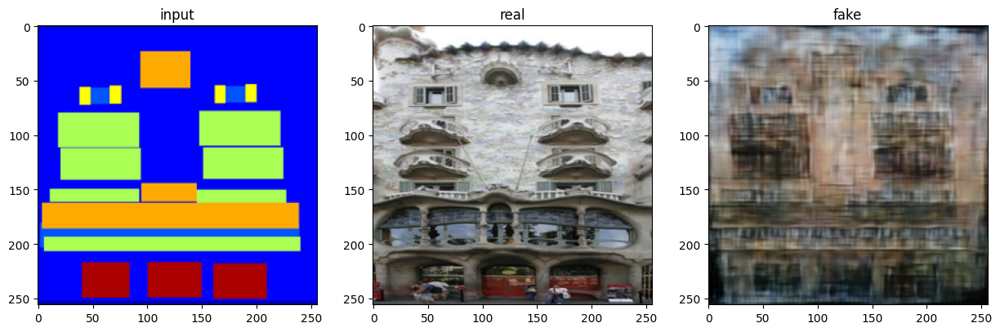

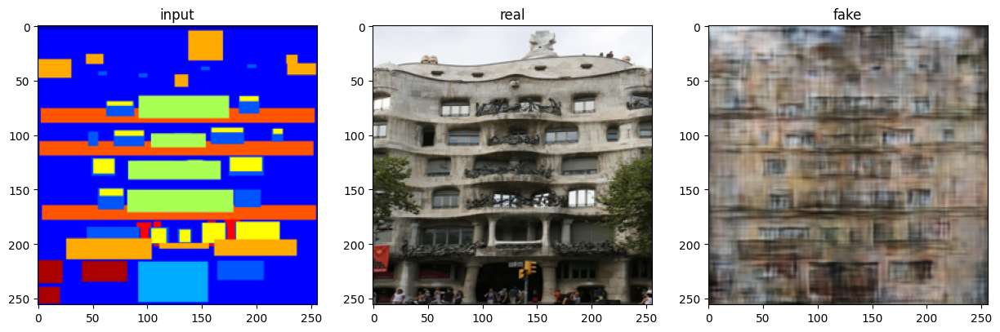

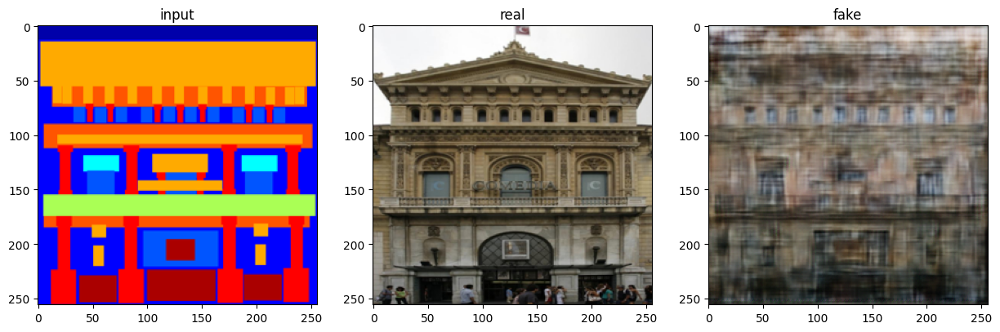

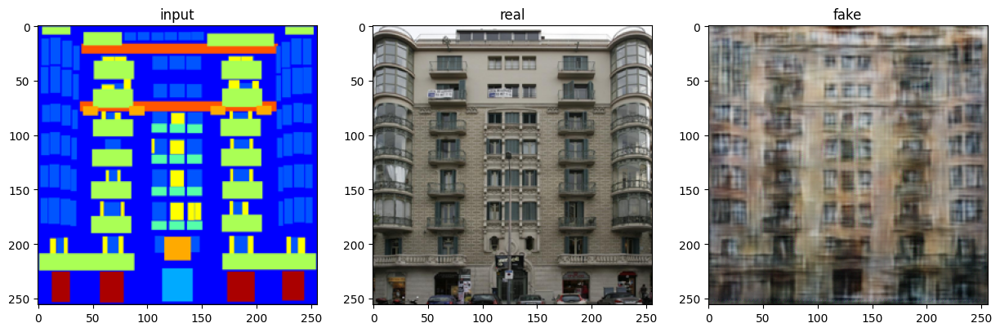

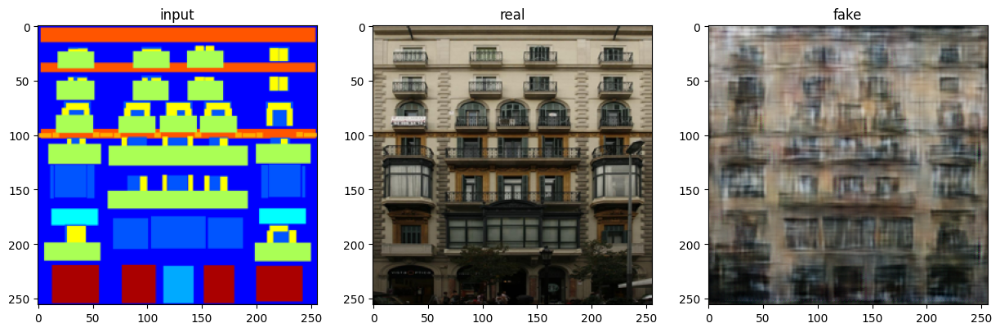

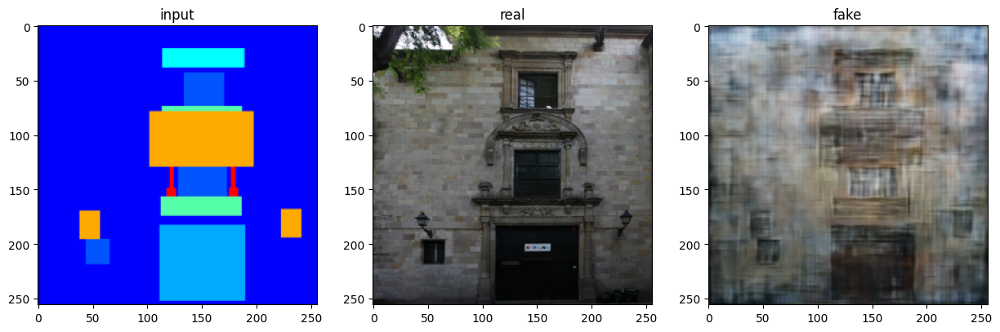

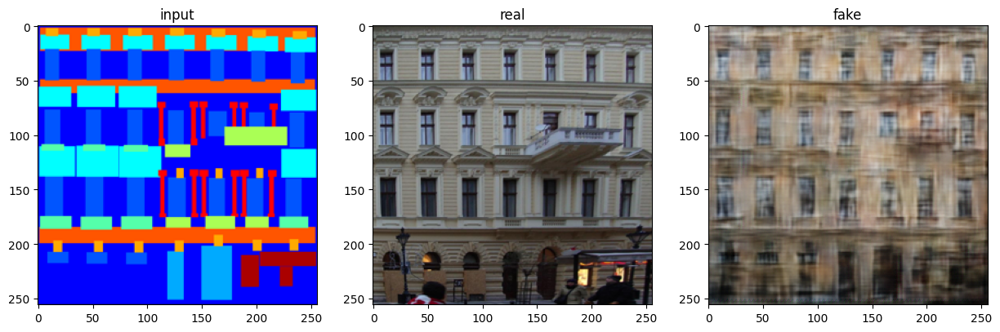

In [24]:
# show a sample evaluation image on the validation dataset
image, mask = next(iter(val_dataloader))
output = generator(mask.type(Tensor))
output = output.view(8, 3, 256, 256)
output = output.cpu().detach()
for i in range(8):
    image_plot = reverse_transform(image[i])
    output_plot = reverse_transform(output[i])
    mask_plot = reverse_transform(mask[i])
    plot2x3Array(mask_plot,image_plot,output_plot)

<font color='red'>**Question 4**</font>                                                                  
Compare results for 100 and 200 epochs
> I make the same plot with an additional columns for the 100-epoch model.

In [32]:
def plot2x4Array(image, mask, predict100, predict200):
    f, axarr = plt.subplots(1,4,figsize=(20,20))
    axarr[0].imshow(image)
    axarr[1].imshow(mask)
    axarr[2].imshow(predict100)
    axarr[3].imshow(predict200)
    axarr[0].set_title('input')
    axarr[1].set_title('real')
    axarr[2].set_title('fake image 100 epochs')
    axarr[3].set_title('fake image 200 epochs')

In [32]:
# TO DO : Your code here to load and evaluate with a few samples
#         a model after 100 epochs


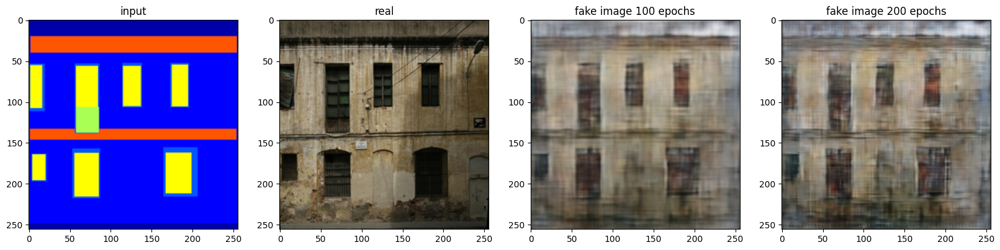

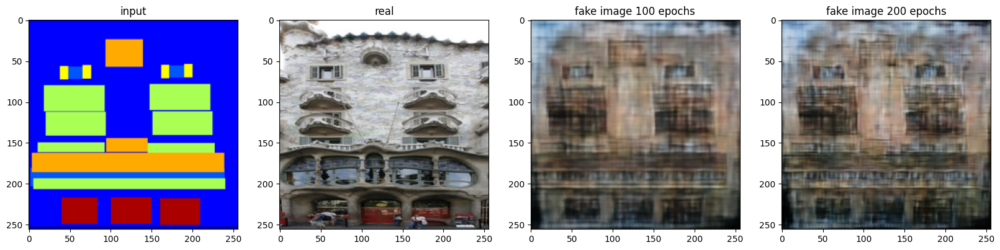

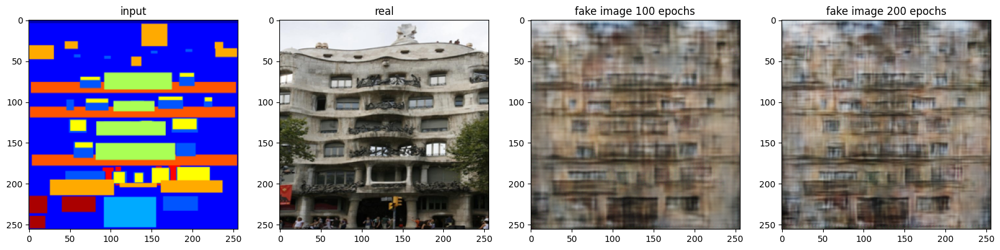

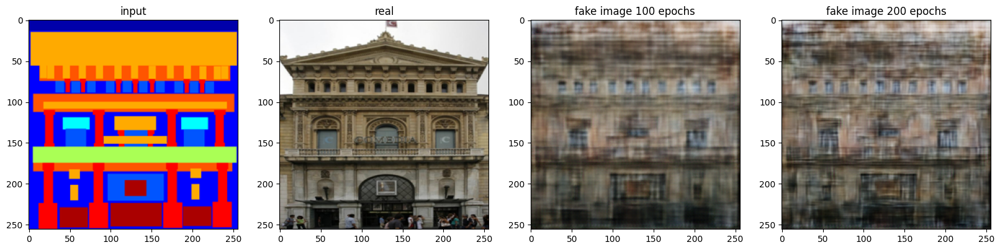

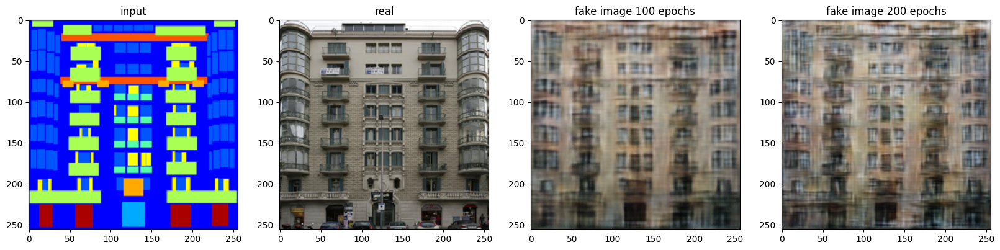

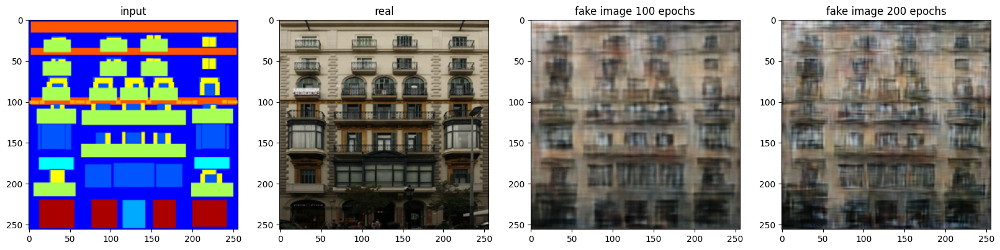

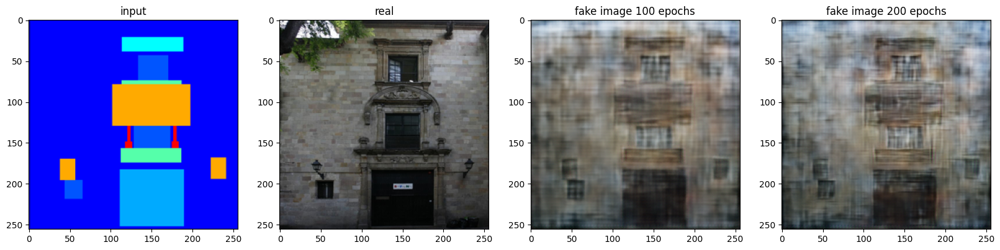

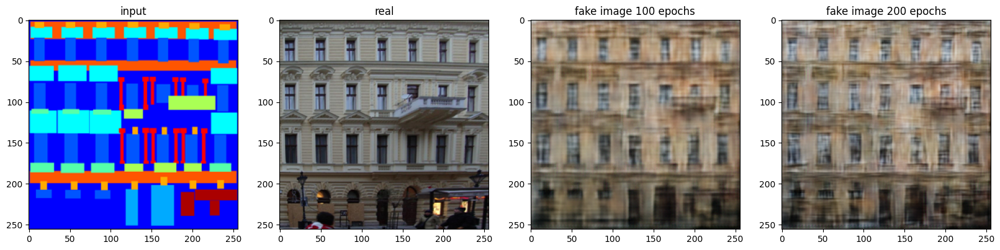

In [33]:
image, mask = next(iter(val_dataloader))

load_model(99)
output100 = generator(mask.type(Tensor))
output100 = output100.view(8, 3, 256, 256)
output100 = output100.cpu().detach()

load_model(199)
output200 = generator(mask.type(Tensor))
output200 = output200.view(8, 3, 256, 256)
output200 = output200.cpu().detach()


for i in range(8):
    image_plot = reverse_transform(image[i])
    output100_plot = reverse_transform(output100[i])
    output200_plot = reverse_transform(output200[i])
    mask_plot = reverse_transform(mask[i])
    plot2x4Array(mask_plot, image_plot, output100_plot, output200_plot)

> The 200-epoch model's output are a bit better than the 100-epoch model. <br>
> Overall the images are blurry, probably because of the use of the MSE loss.

In [34]:
# And finally :
if cuda:
    torch.cuda.empty_cache()

# How to submit your Work ?

This work must be done individually. The expected output is a private repository named gan-cgan on https://gitlab.ec-lyon.fr. It must contain your notebook (or python files) and a README.md file that explains briefly the successive steps of the project. Don't forget to add your teacher as developer member of the project. The last commit is due before 11:59 pm on Monday, April 1st, 2024. Subsequent commits will not be considered.